In [1]:
import os.path as osp

import torch
import faiss

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import numpy as np

In [2]:
def load_data(proj_dir, model_name, image_dir_name):
    # Load embeddings, labels, and filepaths
    embeddings = torch.load(osp.join(proj_dir, f'{model_name}_{image_dir_name}_outputs.pth'))
    embeddings = embeddings.cpu()
    with open(osp.join(proj_dir, f'{model_name}_{image_dir_name}_image_paths.txt'), 'r') as f:
        filepaths = [line.strip() for line in f]
    with open(osp.join(proj_dir, f'{model_name}_{image_dir_name}_labels.txt'), 'r') as f:
        labels = [line.strip() for line in f]
    return embeddings, filepaths, labels

In [3]:
def find_most_similar_pairs(embeddings, labels, N):
    # Normalize embeddings
    embeddings = embeddings / np.linalg.norm(embeddings, axis=1)[:, None]

    # Build a faiss index
    index = faiss.IndexFlatL2(embeddings.shape[1])
    index.add(embeddings)

    # Find the most similar pairs
    _, indices = index.search(embeddings, 2)  # We search the 2 nearest neighbors, the nearest one is the embedding itself

    similar_pairs = []
    for i, (label, idx) in enumerate(zip(labels, indices)):
        if labels[idx[1]] != label:  # If the second nearest embedding is not from the same class
            similar_pairs.append((i, idx[1]))

    # Sort the pairs by similarity
    similar_pairs.sort(key=lambda x: np.dot(embeddings[x[0]], embeddings[x[1]]), reverse=True)

    # Return the top N pairs
    return similar_pairs[:N]

In [4]:
def visualize_pairs(filepaths, pairs, labels):
    for i, (idx1, idx2) in enumerate(pairs):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        img1 = mpimg.imread(filepaths[idx1])
        plt.imshow(img1)
        plt.title(f'Image 1 - Class: {labels[idx1]}\nfile: {filepaths[idx1].split("/")[-1]}')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        img2 = mpimg.imread(filepaths[idx2])
        plt.imshow(img2)
        plt.title(f'Image 2 - Class: {labels[idx2]}\nfile: {filepaths[idx2].split("/")[-1]}')
        plt.axis('off')

        plt.suptitle(f'Pair {i+1}')
        plt.show()

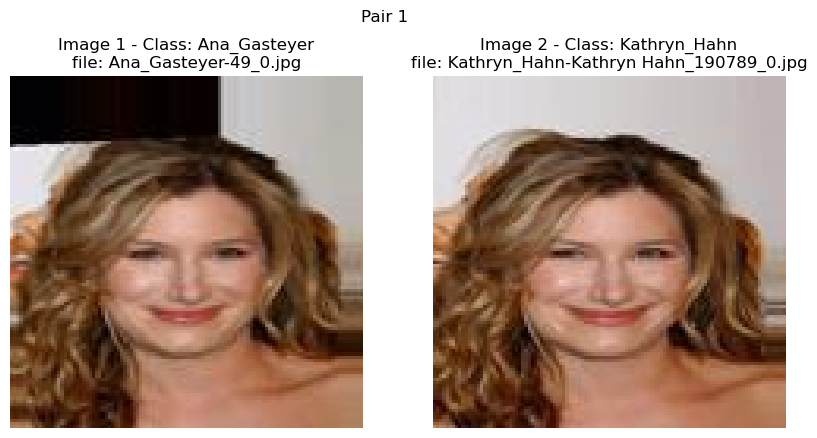

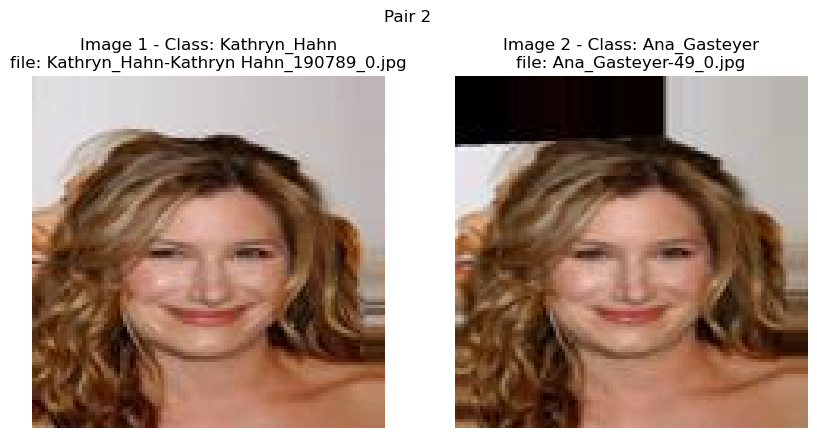

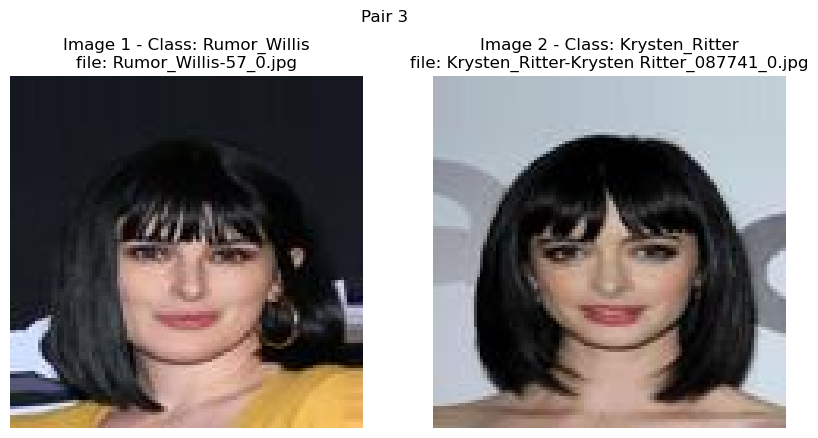

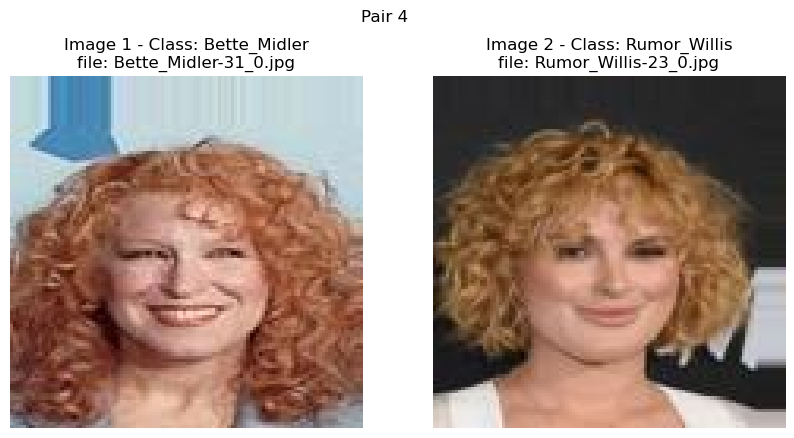

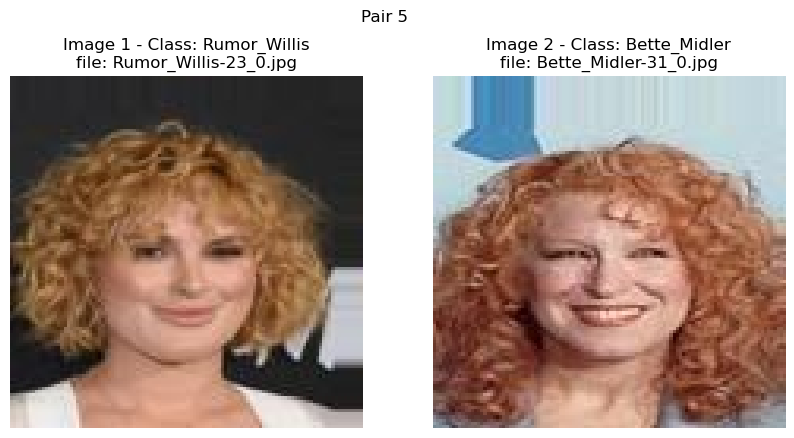

...

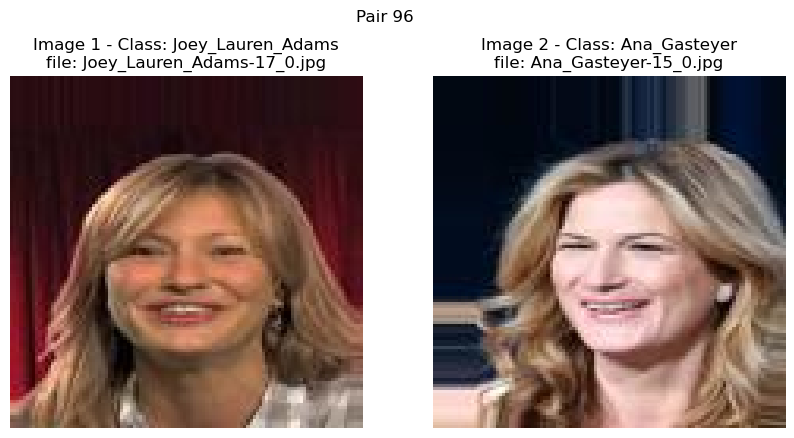

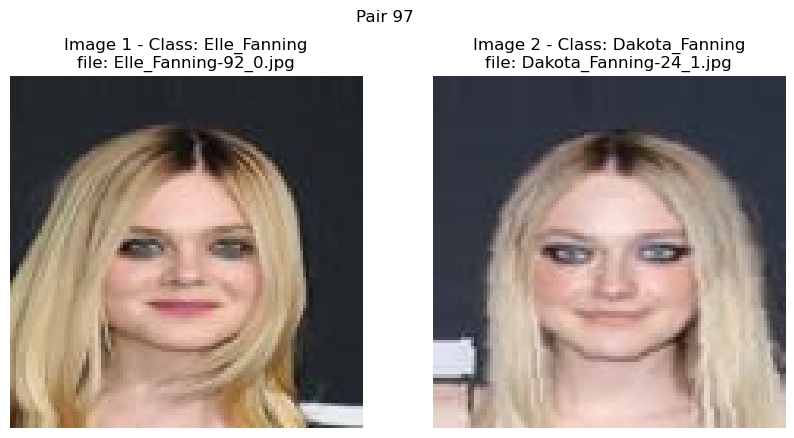

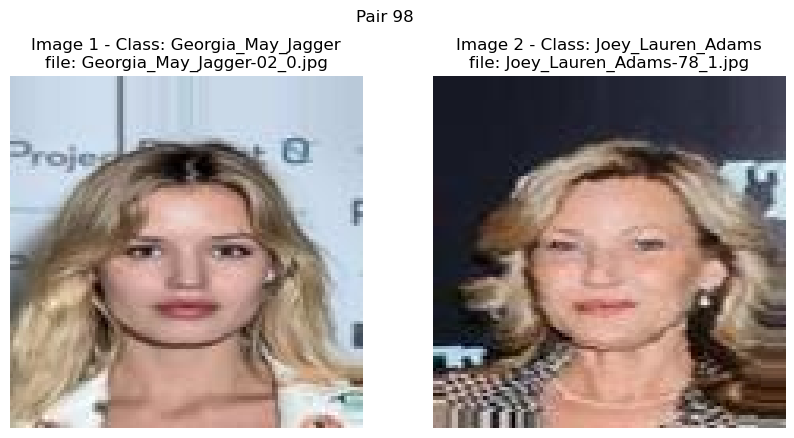

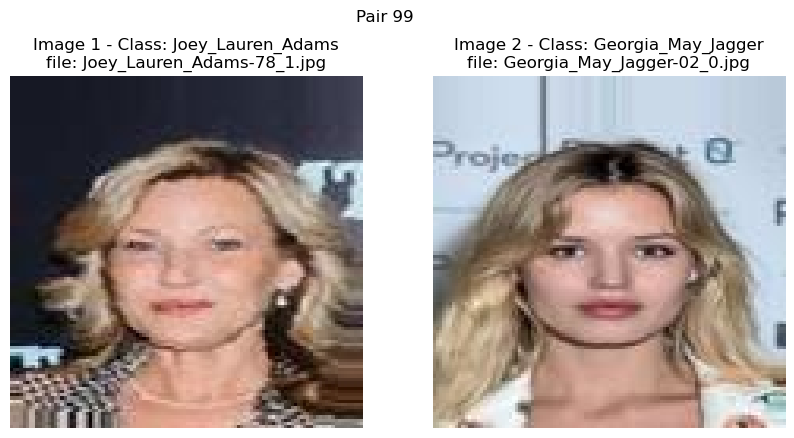

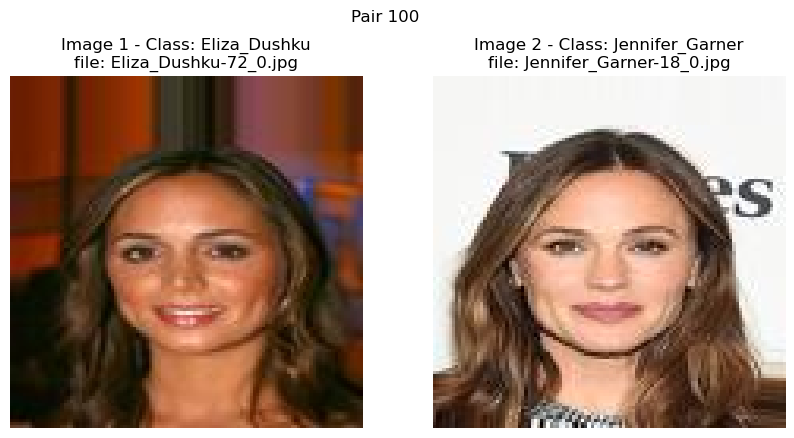

: 

In [5]:
proj_dir = '../project/mworks13/20240221_125626'
model_name = 'model_240000'
image_dir_name = 'DoppelVer_All_112x112'
N = 100  # Number of pairs to visualize

embeddings, filepaths, labels = load_data(proj_dir, model_name, image_dir_name)
pairs = find_most_similar_pairs(embeddings, labels, N)
visualize_pairs(filepaths, pairs, labels)